In [3]:
!kaggle datasets download -d skihikingkevin/pubg-match-deaths

Dataset URL: https://www.kaggle.com/datasets/skihikingkevin/pubg-match-deaths
License(s): CC0-1.0
100%|█████████████████████████████████████▉| 4.10G/4.10G [03:08<00:00, 28.3MB/s]
100%|██████████████████████████████████████| 4.10G/4.10G [03:08<00:00, 23.3MB/s]


In [8]:
import zipfile
# 압축 파일 해제
with zipfile.ZipFile('pubg-match-deaths.zip', 'r') as zip_ref:
    zip_ref.extractall('pubgmatchdeaths')

In [1]:
import os
di = 'pubgmatchdeaths'
os.listdir(di)
for indi in os.listdir(di):
    if not indi.endswith(".jpg"):
        print(indi, os.listdir(di + "/" +indi))

aggregate ['agg_match_stats_1.csv', 'agg_match_stats_0.csv', 'agg_match_stats_3.csv', 'agg_match_stats_4.csv', 'agg_match_stats_2.csv']
deaths ['kill_match_stats_final_2.csv', 'kill_match_stats_final_4.csv', 'kill_match_stats_final_0.csv', 'kill_match_stats_final_1.csv', 'kill_match_stats_final_3.csv']


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.cluster import KMeans
import networkx as nx
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import f_oneway
import matplotlib.lines as mlines

# 모든 데이터로 할 때

In [375]:
# 데이터 합치기
agg_match_stats = pd.DataFrame()
for i in os.listdir(di+"/aggregate"):
    agg_match_stats = pd.concat([agg_match_stats, pd.read_csv(di + "/aggregate/" + i)], axis = 0)
kill_match_stats_final = pd.DataFrame()
for i in os.listdir(di+"/deaths"):
    kill_match_stats_final = pd.concat([kill_match_stats_final, pd.read_csv(di + "/deaths/" + i)], axis = 0)

agg_match_stats = agg_match_stats.dropna(axis = 0, how = "any")
kill_match_cut = kill_match_cut.dropna(axis = 0, how = "any")


KeyboardInterrupt



# 한개 데이터로 할 때

In [3]:
agg_match_stats = pd.read_csv(di + "/aggregate/agg_match_stats_0.csv")
kill_match_stats_final = pd.read_csv(di + "/deaths/kill_match_stats_final_0.csv")


In [4]:
agg_match_stats = agg_match_stats.dropna(axis = 0, how = "any")
kill_match_stats_final = kill_match_stats_final.dropna(axis = 0, how = "any")

## 전처리

In [5]:
## 죽인 거리 열 추가
kill_match_stats_final["kill_distance"] = ((
    kill_match_stats_final["killer_position_x"] - kill_match_stats_final["victim_position_x"]) ** 2 + (
    kill_match_stats_final["killer_position_y"] - kill_match_stats_final["victim_position_y"]) ** 2) ** (1/2)

## 맵 외부에서 킬 혹은 사망은 제외.
positions = ['killer_position_x', 'killer_position_y', 'victim_position_x', 'victim_position_y']
for num, i in enumerate(positions):
    
    if num == 0:
        cut1 = kill_match_stats_final[i] < 0
        cut2 = kill_match_stats_final[i] > 800000
        cut = cut1 | cut2
        kill_match_cut = kill_match_stats_final[~cut]
    else:
        cut1 = kill_match_cut[i] < 0
        cut2 = kill_match_cut[i] > 800000
        cut = cut1 | cut2
        kill_match_cut = kill_match_cut[~cut]

In [6]:
# 생존시간 0인 사람 삭제
merged_df = kill_match_cut.merge(agg_match_stats[(agg_match_stats['player_survive_time'] == 0.0) & (agg_match_stats['player_survive_time'] > 2700.0)]
                                ,left_on=['match_id', 'victim_name'], 
                                 right_on=['match_id', 'player_name'], how='left', indicator=True)
to_delete = merged_df[merged_df['_merge'] == 'both'].index
kill_match_cut = kill_match_cut.drop(to_delete)

# # killer_name 컬럼의 #unknown 삭제
# print(kill_match_cut['killer_name'].value_counts().head())
kill_match_cut = kill_match_cut[~(kill_match_cut['killer_name'] == '#unknown')]

# 안움직인 사람 제외
agg_match_stats = agg_match_stats[~(agg_match_stats['player_dist_walk'] == 0.0)]

# 자살 제외
kill_match_cut = kill_match_cut[~(kill_match_cut['killer_name'] == kill_match_cut['victim_name'])]

In [7]:
# 유저 플레이 수 추가
agg_match_stats['player_play_cnt'] = agg_match_stats.groupby('player_name')['player_name'].transform('count')

In [17]:
agg_match_stats = agg_match_stats[~(agg_match_stats['player_survive_time'] > 2700.0)]

### 분석 방향.
- 맵 별로 다르게 분석. 스쿼드 인원 별로 다르게 분석. -> 이것만 해도, 맵 2개, 스쿼드 종류 3개 = 6가지로 분석이 이루어 짐.
- 게임 별 다수 킬한 사람의 추적 분석 (시간대 분석)
- PCA, clustering 으로, 3개 분류. (저돌적 / 일반 / 존버)
- Decision Tree를 이용하여 survive time 예측

### 분석 주의점
- 한 게임에서 삭제해야 할 것.
    - 너무 긴 거리에서의 킬은 삭제.
    - 맵 외부 좌표 삭제.
    - 파티 인원 수 별로, 1인 = 1~100위 / 2인 = 1~50위 / 4인 = 1~25위 나머지 삭제
    - 플레이 시간은 40분 내외. (bluezone) 45분 이상 survive는 삭제
    - 자살 삭제


### 이 분석으로 알고 싶은 것.
- 첫 킬 지점, 이동거리, 데미지 등 으로 1등까지 걸리는 시간 예측.
- 클러스터링으로 분류해서 3가지 타입 별 예측.

In [8]:
guns = [
    'SCAR-L', 'S686', 'M416', 'AKM', 'P92', 'Win94', 'M16A4', 'S12K', 
    'death.WeapSawnoff_C', 'Kar98k', 'Tommy Gun', 'S1897', 'Grenade', 
    'Micro UZI', 'P1911', 'SKS', 'Mini 14', 'Mk14', 'UMP9', 'P18C', 
    'Groza', 'Crossbow', 'Vector', 'R1895', 'M249', 'M24', 'VSS', 'AWM', 
    'DP-28', 'R45', 'AUG'
]


external_factors = [
    'Down and Out', 'Punch', 'Hit by Car', 'Bluezone', 'Sickle', 'Drown', 
    'Falling', 'Uaz', 'Pan', 'Dacia', 'Motorbike', 'death.Buff_FireDOT_C', 
    'Crowbar', 'Motorbike (SideCar)', 'Machete', 'Buggy', 'Van', 'Pickup Truck', 
    'death.ProjMolotov_DamageField_C', 'Aquarail', 'Boat', 'RedZone', 
    'death.ProjMolotov_C', 'death.PG117_A_01_C'
]

# 총기류 1, 외부요인 0
def classify_killed_by(value):
    if value in guns:
        return 1
    elif value in external_factors:
        return 0
    else:
        return None

kill_match_cut['killed_by_bi'] = kill_match_cut['killed_by'].apply(classify_killed_by)
kill_match_cut.head()


,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y,kill_distance,killed_by_bi
1,SCAR-L,nide2Bxiaojiejie,31.0,93091.37,722236.4,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,194,X3evolution,33.0,92238.68,723375.1,1422.574401,1
2,S686,Ascholes,43.0,366921.40,421623.9,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,103,CtrlZee,46.0,367304.50,421216.1,559.523413,1
3,Down and Out,Weirdo7777,9.0,472014.20,313274.8,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,BlackDpre,13.0,476645.90,316758.4,5795.525330,0
4,M416,Solayuki1,9.0,473357.80,318340.5,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,Vjolt,13.0,473588.50,318418.8,243.625491,1
5,Punch,xuezhiqian717,26.0,721944.40,359575.3,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,123,PurplePenguin9,47.0,0.00,0.0,806534.632277,0


In [9]:
merged_data = pd.merge(kill_match_cut, agg_match_stats, 
                       left_on=['match_id', 'killer_name'], 
                       right_on=['match_id', 'player_name'], 
                       how='left')
dropcol = ['date', 'game_size', 'match_mode', 'player_name']
merged_data.drop(columns = dropcol, inplace = True)

merged_data.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,...,player_assists,player_dbno,player_dist_ride,player_dist_walk,player_dmg,player_kills,player_survive_time,team_id,team_placement,player_play_cnt
0,SCAR-L,nide2Bxiaojiejie,31.0,93091.37,722236.4,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,194,X3evolution,33.0,...,0.0,1.0,78.05448,366.673737,206.0,2.0,215.627,5.0,31.0,42.0
1,S686,Ascholes,43.0,366921.40,421623.9,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,103,CtrlZee,46.0,...,0.0,1.0,0.00000,28.314629,200.0,2.0,117.053,44.0,43.0,12.0
2,Down and Out,Weirdo7777,9.0,472014.20,313274.8,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,BlackDpre,13.0,...,0.0,1.0,4287.49700,1924.983640,111.0,1.0,1244.531,14.0,9.0,2.0
3,M416,Solayuki1,9.0,473357.80,318340.5,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,1018,Vjolt,13.0,...,0.0,0.0,3792.11523,2298.729490,75.0,1.0,1244.636,14.0,9.0,1.0
4,Punch,xuezhiqian717,26.0,721944.40,359575.3,MIRAMAR,2U4GBNA0YmnLSqvEycnTjo-KT000vfUnhSA2vfVhVPe1QB...,123,PurplePenguin9,47.0,...,0.0,1.0,0.00000,410.543762,300.0,3.0,879.272,27.0,26.0,3.0


In [10]:
# 맵과 스쿼드 종류별로 데이터 분리
map_types = ['MIRAMAR', 'ERANGEL']
squad_types = [1, 2, 4]  # 솔로, 듀오, 스쿼드

# 맵과 스쿼드별로 데이터를 분리
map_squad_data = {}
for map_type in map_types:
    for squad_type in squad_types:
        key = f"{map_type}_squad_{squad_type}"
        map_squad_data[key] = merged_data[(merged_data['map'] == map_type) & (merged_data['party_size'] == squad_type)]

In [11]:
## 최종 맵 그림
def plot_on_map(mode):
    kill_df = map_squad_data[mode]
    unique_match_ids = list(kill_df['match_id'].unique())[:30]
    map_name = mode.split("_")[0].lower()
    img = plt.imread(di + "/%s.jpg" %map_name)
    plt.subplots(figsize = (10,10))
    plt.imshow(img,aspect='auto', extent=[0, 800000, 0, 800000], alpha = 0.7)

    # 각 match 별로 다르게 그리기
    for i, sample_id in enumerate(unique_match_ids):
        sample_df = kill_df[kill_df['match_id'] == sample_id].sort_values(by='time')
        both_sample_df = sample_df[(sample_df['killer_placement'] == 1.0) & (sample_df['player_kills'] == sample_df['player_kills'].max())].sort_values(by='time')
        sample_df = sample_df[~sample_df.isin(both_sample_df).all(axis=1)]

        place_sample_df = sample_df[sample_df['killer_placement'] == 1.0].sort_values(by='time')
        killer_sample_df = sample_df[sample_df['player_kills'] == sample_df['player_kills'].max()].sort_values(by='time')

        # BOTH
        if not both_sample_df.size == 0:
            plt.plot(both_sample_df['killer_position_x'], both_sample_df['killer_position_y'],marker='*',linestyle='-', color = 'yellow',
                    label='Both 1st')
            plt.scatter(both_sample_df['killer_position_x'].iloc[-1], both_sample_df['killer_position_y'].iloc[-1], color='black', s=200, marker='X', label='Final BlueZone')

        # 1st
        if not place_sample_df.size == 0:
            plt.plot(place_sample_df['killer_position_x'], place_sample_df['killer_position_y'], marker='*',linestyle='-', color = 'blue',
                    label='Chicken')
            plt.scatter(place_sample_df['killer_position_x'].iloc[-1], place_sample_df['killer_position_y'].iloc[-1], color='black', s=200, marker='X')

        # KILLER
        if not killer_sample_df.size == 0:
            plt.plot(killer_sample_df['killer_position_x'], killer_sample_df['killer_position_y'], marker='*',linestyle='-', color = 'red',
                    label='Killer')
            plt.scatter(killer_sample_df['killer_position_x'].iloc[-1], killer_sample_df['killer_position_y'].iloc[-1], color='red', s=200, marker='X', label = 'Killer death')

    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys())
    plt.title('%s Game\'s 1st Path' %mode)
    plt.show()

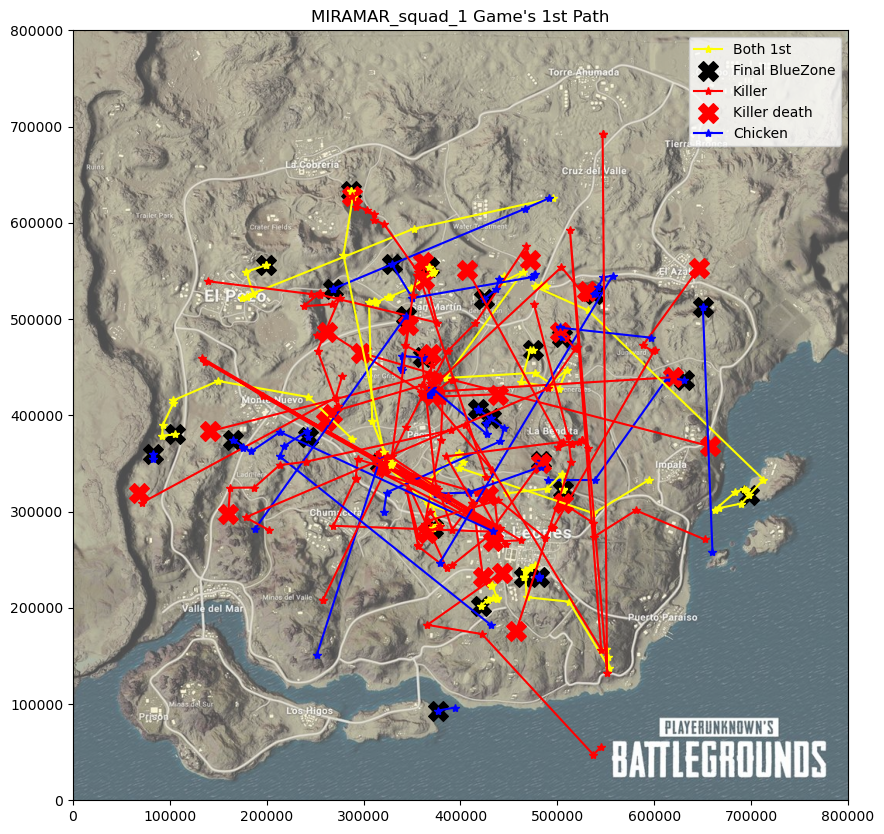

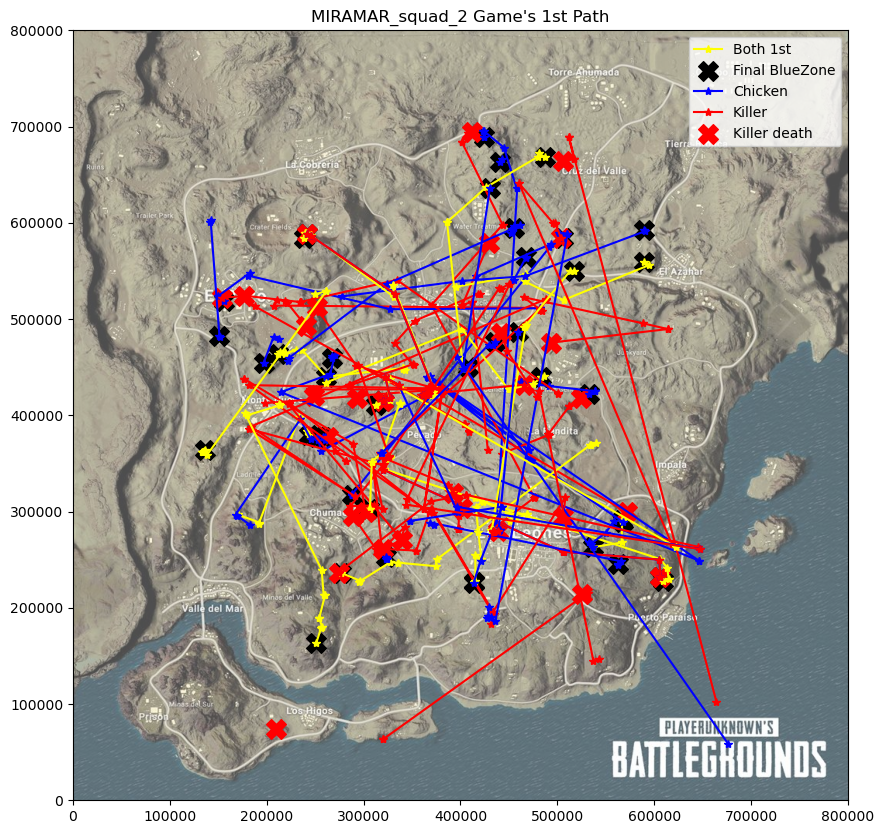

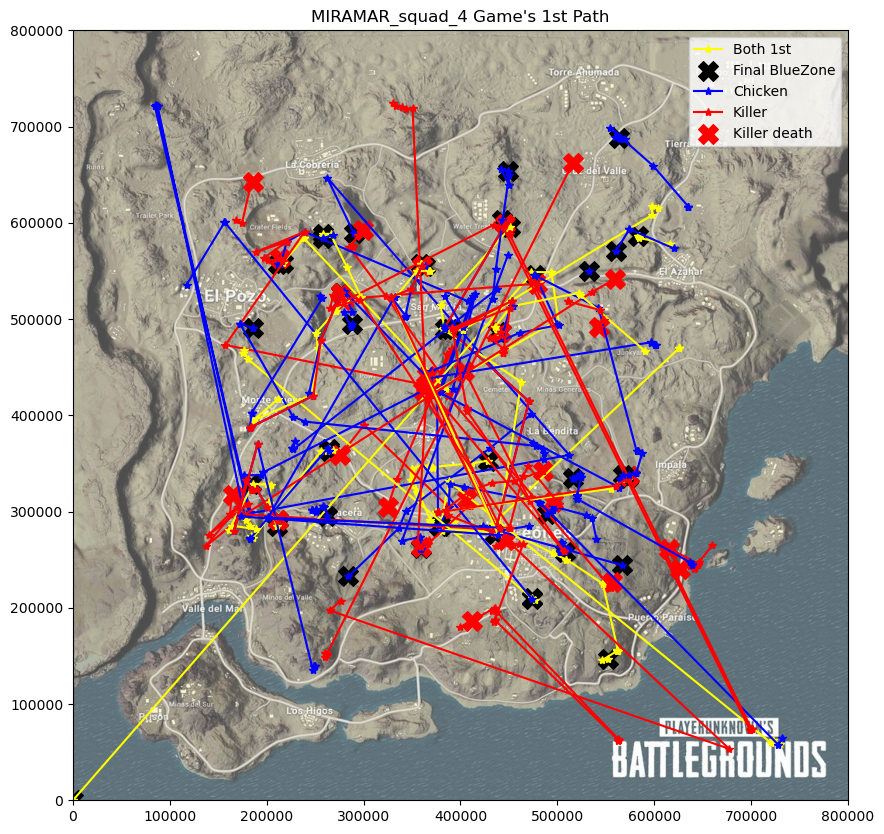

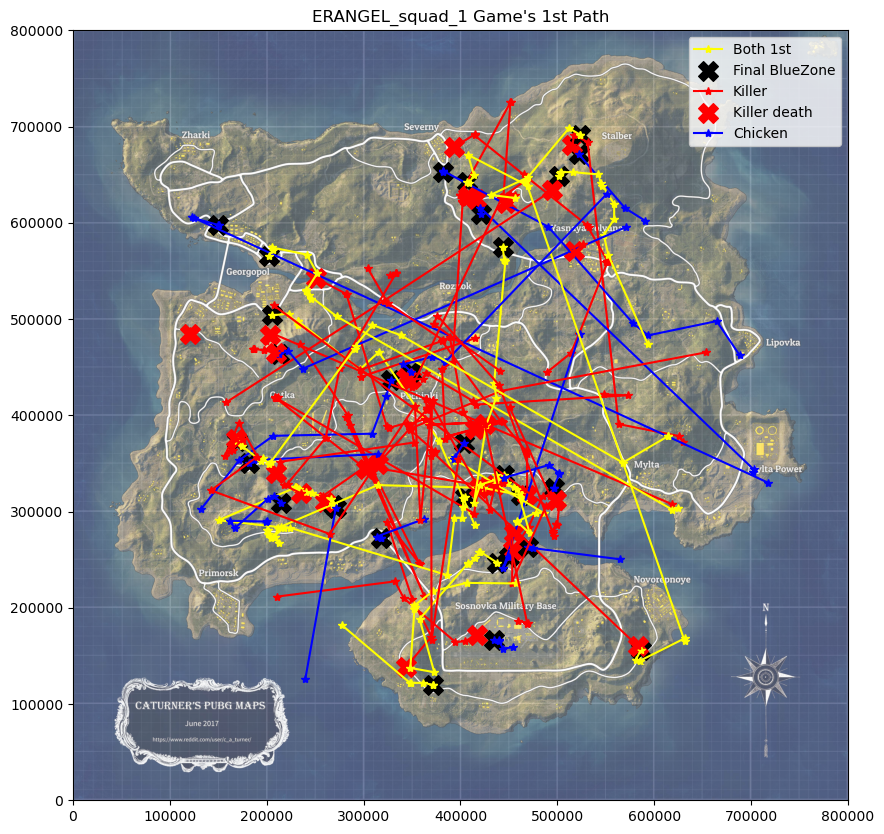

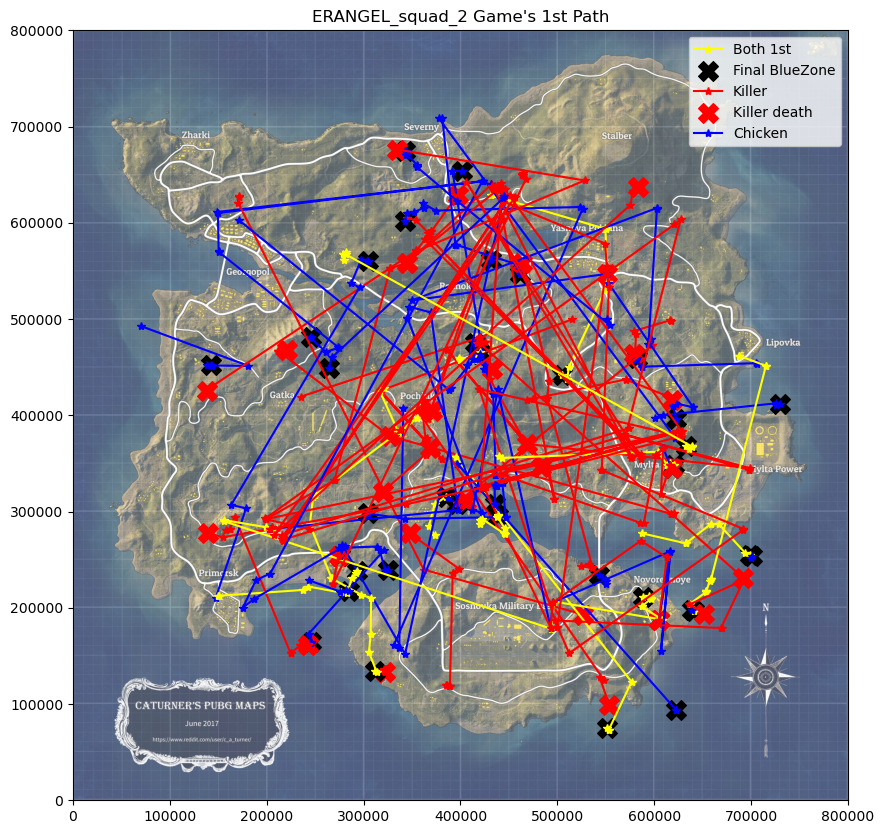

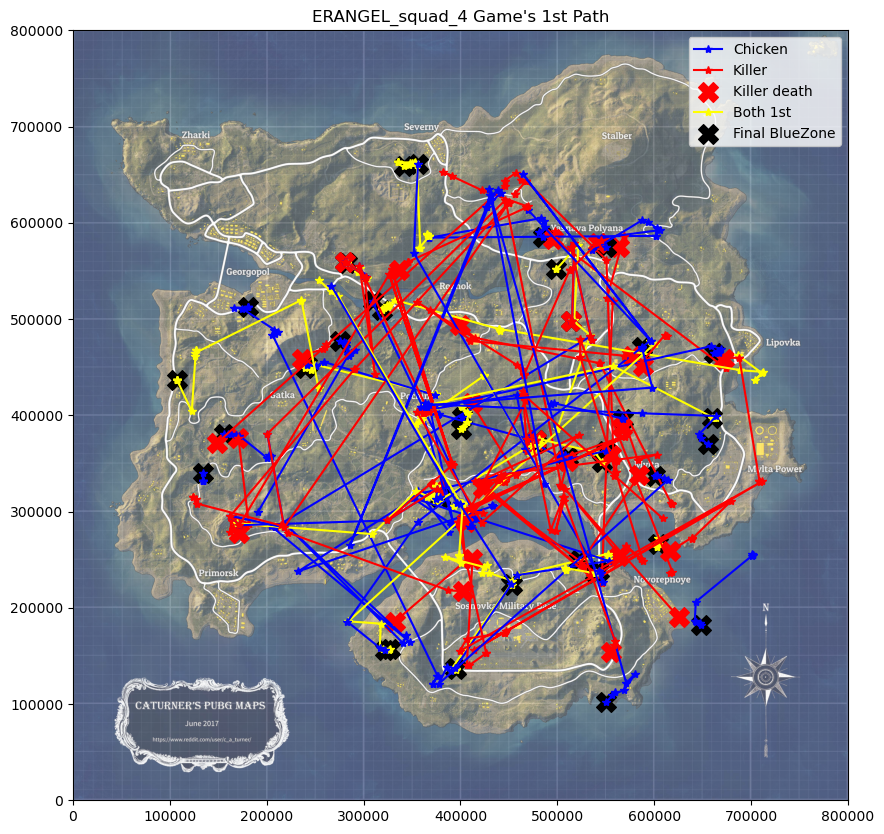

In [17]:
for i, md in enumerate(map_squad_data.keys()):
    plot_on_map(md)

In [54]:
def six_plot_one(func):
    fig, axes = plt.subplots(len(map_types), len(squad_types), figsize=(20, 15))
    fig.suptitle('Map and Squad Type', fontsize=16)

    for i, map_type in enumerate(map_types):
        for j, squad_type in enumerate(squad_types):
            key = f"{map_type}_squad_{squad_type}"
            data = map_squad_data[key]
            ax = axes[i, j]
#             survive_dmg_plot(data, ax, map_type, squad_type)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

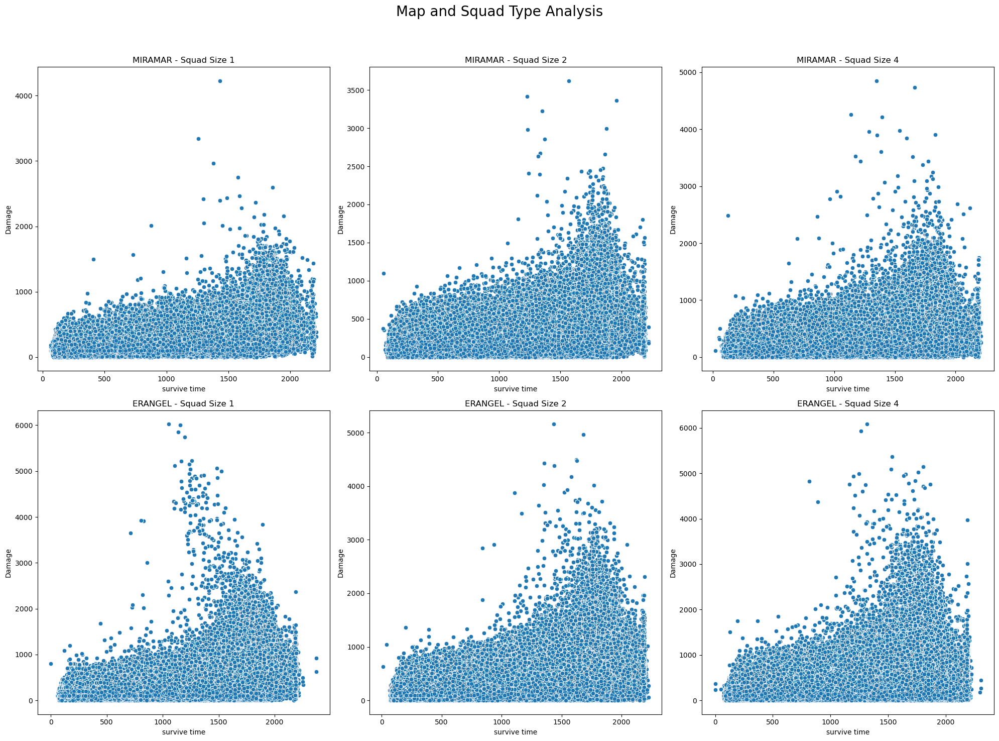

In [165]:
fig, axes = plt.subplots(len(map_types), len(squad_types), figsize=(20, 15))
fig.suptitle('Map and Squad Type Analysis', fontsize=20)

for i, map_type in enumerate(map_types):
    for j, squad_type in enumerate(squad_types):
        key = f"{map_type}_squad_{squad_type}"
        data = map_squad_data[key]
        ax = axes[i, j]
        
        #킬 거리와 피해량의 관계를 시각화
        sns.scatterplot(x='player_survive_time', y='player_dmg', data=data, ax=ax)
        ax.set_title(f'{map_type} - Squad Size {squad_type}')
        ax.set_xlabel('survive time')
        ax.set_ylabel('Damage')
        

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [25]:
def plot_comparison_between_maps_and_party_sizes(data):
    plt.figure(figsize=(8, 4))
    avg_survival_by_map_party = data.groupby(['map', 'party_size'])['player_survive_time'].mean().reset_index()
    avg_survival_by_map_party['party_size'] = avg_survival_by_map_party['party_size'].replace({1: 'SOLO', 2: 'DUO', 4: 'SQUAD'})
    
    sns.barplot(data=avg_survival_by_map_party, x='map', y='player_survive_time', hue='party_size', palette='viridis')
    plt.title('Average Survival Time by Map and Party Size')
    plt.xlabel('Map')
    plt.ylabel('Average Survival Time (seconds)')
    plt.legend(title='Party Size')
    plt.show()

    plt.figure(figsize=(8, 4))
    avg_kills_by_map_party = data.groupby(['map', 'party_size'])['player_kills'].mean().reset_index()
    avg_kills_by_map_party['party_size'] = avg_kills_by_map_party['party_size'].replace({1: 'SOLO', 2: 'DUO', 4: 'SQUAD'})
    
    sns.barplot(data=avg_kills_by_map_party, x='map', y='player_kills', hue='party_size', palette='magma')
    plt.title('Average Kills by Map and Party Size')
    plt.xlabel('Map')
    plt.ylabel('Average Kills')
    plt.legend(title='Party Size')
    plt.show()

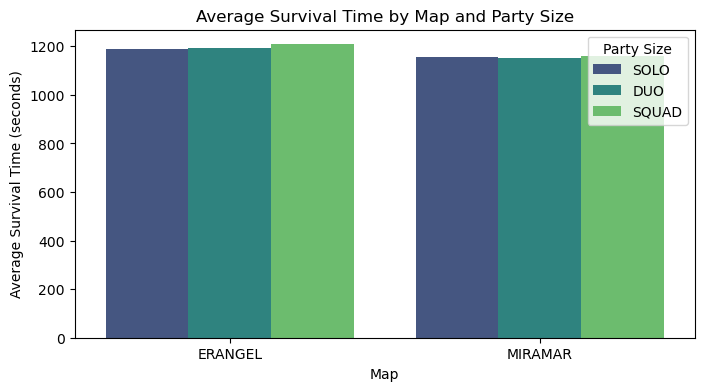

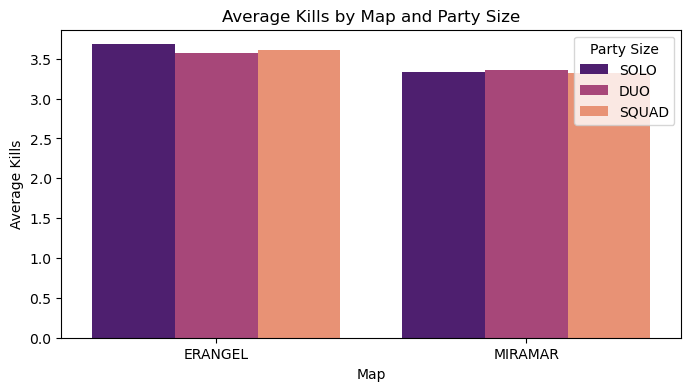

In [26]:
plot_comparison_between_maps_and_party_sizes(merged_data)

In [27]:
merged_data.columns

Index(['killed_by', 'killer_name', 'killer_placement', 'killer_position_x',
       'killer_position_y', 'map', 'match_id', 'time', 'victim_name',
       'victim_placement', 'victim_position_x', 'victim_position_y',
       'kill_distance', 'killed_by_bi', 'party_size', 'player_assists',
       'player_dbno', 'player_dist_ride', 'player_dist_walk', 'player_dmg',
       'player_kills', 'player_survive_time', 'team_id', 'team_placement',
       'player_play_cnt'],
      dtype='object')

In [28]:
# drive_type 
merged_data['drive_type'] = merged_data['player_dist_ride'].apply(lambda x: 'No drive' if x == 0 else 'Drive & Walk')

In [41]:
merged_data = merged_data.dropna()

In [44]:
from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test


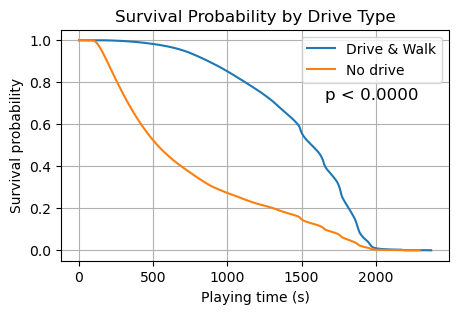

In [46]:
def plot_survival_analysis(data):
    # Kaplan-Meier survival analysis plot
    kmf = KaplanMeierFitter()
    plt.figure(figsize=(5, 3))

    for label, group in data.groupby('drive_type'):
        kmf.fit(group['player_survive_time'], event_observed=group['player_kills'] > 0, label=label)
        kmf.plot(ci_show=False)
    
    # Log-rank test for p-value calculation
    groups = data['drive_type'].unique()
    if len(groups) == 2:
        group_1 = data[data['drive_type'] == groups[0]]
        group_2 = data[data['drive_type'] == groups[1]]
        results = logrank_test(group_1['player_survive_time'], group_2['player_survive_time'],
                               event_observed_A=group_1['player_kills'] > 0,
                               event_observed_B=group_2['player_kills'] > 0)
        p_value = results.p_value
        plt.text(x=0.8, y=0.7, s=f'p < {p_value:.4f}', fontsize=12, transform=plt.gca().transAxes, ha='center')
    
    plt.title('Survival Probability by Drive Type')
    plt.xlabel('Playing time (s)')
    plt.ylabel('Survival probability')
    plt.grid(True)
    plt.show()

    
if 'drive_type' in merged_data.columns:
    plot_survival_analysis(merged_data)

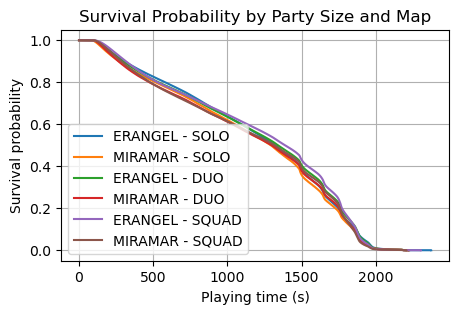

In [47]:
def plot_survival_analysis_by_party_size_and_map(data):
    # Kaplan-Meier survival analysis plot by party size and map
    kmf = KaplanMeierFitter()
    plt.figure(figsize=(5, 3))

    for (party_size, map_type), group in data.groupby(['party_size', 'map']):
        label = f'{map_type} - {"SOLO" if party_size == 1 else "DUO" if party_size == 2 else "SQUAD"}'
        kmf.fit(group['player_survive_time'], event_observed=group['player_kills'] > 0, label=label)
        kmf.plot(ci_show=False)
    
    plt.title('Survival Probability by Party Size and Map')
    plt.xlabel('Playing time (s)')
    plt.ylabel('Survival probability')
    plt.grid(True)
    plt.legend(loc='best')
    plt.show()
plot_survival_analysis_by_party_size_and_map(merged_data)

In [48]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [75]:
sample_df = map_squad_data['ERANGEL_squad_1']

In [76]:
# Q1 = sample_df[['player_dist_total', 'player_survive_time', 'player_dmg']].quantile(0.25)
# Q3 = sample_df[['player_dist_total', 'player_survive_time', 'player_dmg']].quantile(0.75)
# IQR = Q3 - Q1

# # IQR 범위 밖의 값들을 제거
# sample_df = sample_df[~((sample_df < (Q1 - 1.5 * IQR)) | (sample_df > (Q3 + 1.5 * IQR))).any(axis=1)]

import numpy as np

# 로그 변환 (NaN 및 음수 방지를 위해 +1 처리)
sample_df['player_dist_total'] = np.log1p(sample_df['player_dist_total'])
sample_df['player_dmg'] = np.log1p(sample_df['player_dmg'])
sample_df = sample_df[~(sample_df.isna().any(axis=1))]


In [77]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# 데이터 준비
high_survivors = sample_df[sample_df['player_survive_time'] > sample_df['player_survive_time'].quantile(0.75)]

# 첫 번째 클러스터링: 생존 시간이 높고, 이동거리가 높으며, 피해량이 낮은 사람들 필터링
high_movement_low_damage = high_survivors[
    (high_survivors['player_dist_total'] > high_survivors['player_dist_total'].median()) &
    (high_survivors['player_dmg'] < high_survivors['player_dmg'].median())
]

# 스케일링 (KMeans를 위해)
scaler = StandardScaler()
scaled_features = scaler.fit_transform(high_movement_low_damage[['player_dist_total', 'player_dmg']])

# KMeans 클러스터링
kmeans = KMeans(n_clusters=3, random_state=42)
high_movement_low_damage['cluster'] = kmeans.fit_predict(scaled_features)

# 각 플레이어에 대해 첫 번째 클러스터링 결과를 추가
sample_df = sample_df.merge(
    high_movement_low_damage[['killer_name', 'cluster']],
    on='killer_name',
    how='left'
)

# 결측치를 처리 (클러스터링에 포함되지 않은 플레이어는 NaN이 되므로, 이를 별도의 값으로 대체)
sample_df['cluster'] = sample_df['cluster'].fillna(-1)

# 4. 전체 데이터에 대한 추가 클러스터링
all_features = scaler.fit_transform(sample_df[['player_dist_total', 'player_dmg', 'cluster']])
kmeans_all = KMeans(n_clusters=3, random_state=42)
sample_df['cluster'] = kmeans_all.fit_predict(all_features)

# sample_df.drop(columns = 'cluster', inplace = True)
print(sample_df[['killer_name', 'cluster']].head())


/tmp/ipykernel_3906736/880210968.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_movement_low_damage['cluster'] = kmeans.fit_predict(scaled_features)


  killer_name  cluster
0  CocaCola01        0
1     MLBBear        1
2   JackieCOC        0
3  CocaCola01        0
4    LORD_JTR        0


In [90]:
sample_df.columns

Index(['killed_by', 'killer_name', 'killer_placement', 'killer_position_x',
       'killer_position_y', 'map', 'match_id', 'time', 'victim_name',
       'victim_placement', 'victim_position_x', 'victim_position_y',
       'kill_distance', 'killed_by_bi', 'party_size', 'player_assists',
       'player_dbno', 'player_dist_ride', 'player_dist_walk', 'player_dmg',
       'player_kills', 'player_survive_time', 'team_id', 'team_placement',
       'player_play_cnt'],
      dtype='object')

In [93]:
def plot_survival_analysis_by_party_size_map_and_cluster(data):
    # Kaplan-Meier survival analysis plot by party size, map, and cluster
    kmf = KaplanMeierFitter()
    plt.figure(figsize=(5, 3))

    # party_size, map, 그리고 Cluster 컬럼으로 그룹화
    for (party_size, map_type, cluster), group in data.groupby(['party_size', 'map', 'cluster']):
        label = f'{map_type} - {"SOLO" if party_size == 1 else "DUO" if party_size == 2 else "SQUAD"} - Cluster {cluster}'
        kmf.fit(group['player_survive_time'], event_observed=group['player_kills'] > 0, label=label)
        kmf.plot(ci_show=False)

    plt.title('Survival by Squad/Map/Cluster')
    plt.xlabel('Playing time (s)')
    plt.ylabel('Survival probability')
    plt.grid(True)
    plt.legend(loc='best')
    plt.show()



def clustering(sample_df):
    sample_df['player_dist_total'] = sample_df['player_dist_ride'] + sample_df['player_dist_walk']
    sample_df['player_dist_total'] = np.log1p(sample_df['player_dist_total'])
    sample_df['player_dmg'] = np.log1p(sample_df['player_dmg'])
    sample_df = sample_df[~(sample_df.isna().any(axis=1))]

    high_survivors = sample_df[sample_df['player_survive_time'] > sample_df['player_survive_time'].quantile(0.75)]

    # 첫 번째 클러스터링: 생존 시간이 높고, 이동거리가 높으며, 피해량이 낮은 사람들 필터링
    high_movement_low_damage = high_survivors[
        (high_survivors['player_dist_total'] > high_survivors['player_dist_total'].median()) &
        (high_survivors['player_dmg'] < high_survivors['player_dmg'].median())
    ]

    # 스케일링 (KMeans를 위해)
    scaler = StandardScaler()
    scaled_features = scaler.fit_transform(high_movement_low_damage[['player_dist_total', 'player_dmg']])

    # KMeans 클러스터링
    kmeans = KMeans(n_clusters=3, random_state=42)
    high_movement_low_damage['cluster'] = kmeans.fit_predict(scaled_features)

    # 각 플레이어에 대해 첫 번째 클러스터링 결과를 추가
    sample_df = sample_df.merge(
        high_movement_low_damage[['killer_name', 'cluster']],
        on='killer_name',
        how='left'
    )

    # 결측치를 처리 (클러스터링에 포함되지 않은 플레이어는 NaN이 되므로, 이를 별도의 값으로 대체)
    sample_df['cluster'] = sample_df['cluster'].fillna(-1)

    # 4. 전체 데이터에 대한 추가 클러스터링
    all_features = scaler.fit_transform(sample_df[['player_dist_total', 'player_dmg', 'cluster']])
    kmeans_all = KMeans(n_clusters=3, random_state=42)
    sample_df['cluster'] = kmeans_all.fit_predict(all_features)

    # sample_df.drop(columns = 'cluster', inplace = True)
    print(sample_df[['killer_name', 'cluster']].head())
    variables = ['player_dist_total', 'player_survive_time', 'player_dmg']
    plt.figure(figsize=(9, 3))
    for i, var in enumerate(variables):
        plt.subplot(1, 3, i + 1)
        sns.violinplot(x='cluster', y=var, data=sample_df)
        plt.title(f'{var} by Cluster')
        plt.xlabel('Cluster')
        plt.ylabel(var)

    plt.tight_layout()
    plt.show()
    plot_survival_analysis_by_party_size_map_and_cluster(sample_df)
    return sample_df

/tmp/ipykernel_3906736/2838422337.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_movement_low_damage['cluster'] = kmeans.fit_predict(scaled_features)


     killer_name  cluster
0          22607        1
1       STRUGGER        2
2  Battlefield-4        1
3          520-o        1
4   hjlkghxfhgfd        2


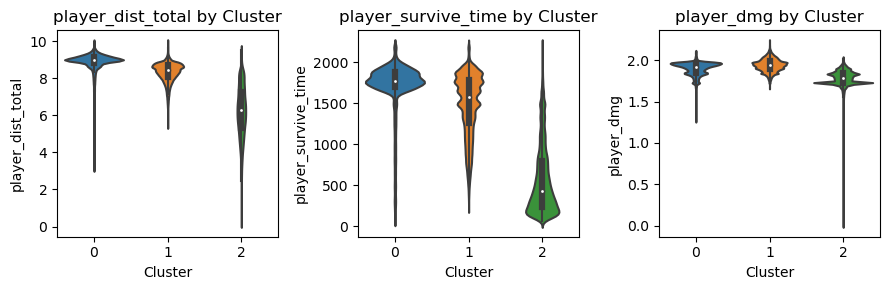

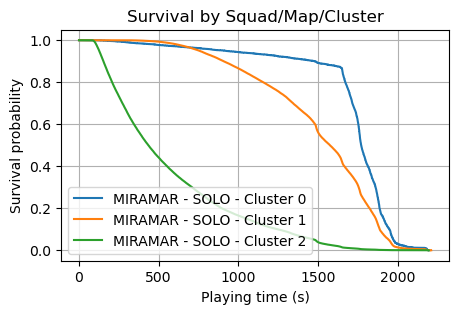

/tmp/ipykernel_3906736/2838422337.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_movement_low_damage['cluster'] = kmeans.fit_predict(scaled_features)


        killer_name  cluster
0  nide2Bxiaojiejie        1
1  nide2Bxiaojiejie        1
2          Ascholes        1
3        Weirdo7777        2
4         Solayuki1        1


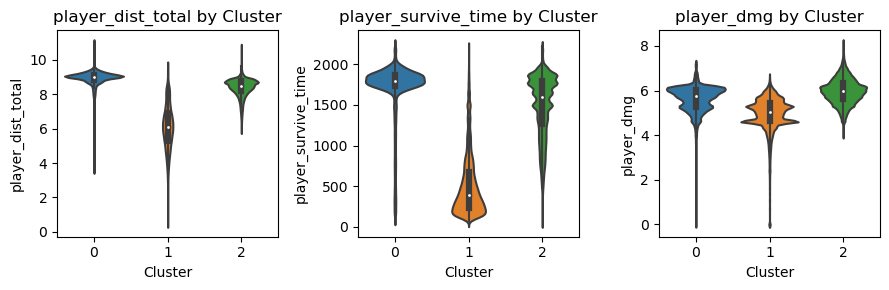

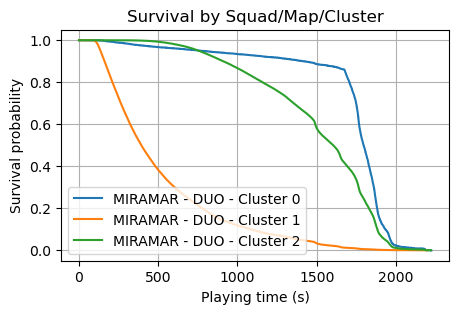

/tmp/ipykernel_3906736/2838422337.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_movement_low_damage['cluster'] = kmeans.fit_predict(scaled_features)


  killer_name  cluster
0   651651646        1
1  leizong725        1
2   651651646        1
3   651651646        1
4   651651646        1


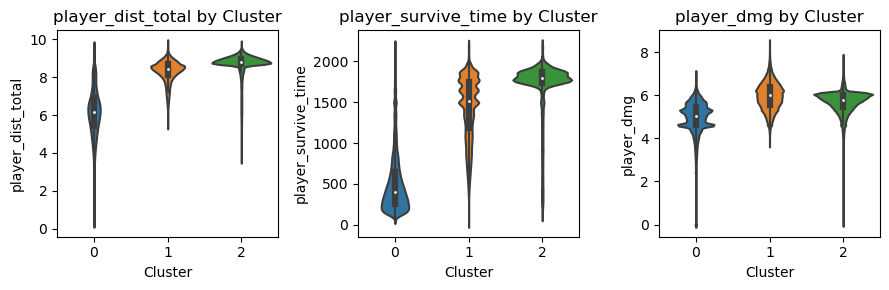

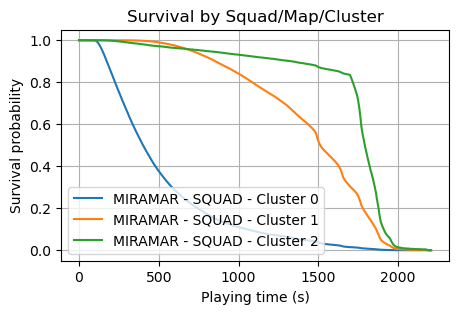

/tmp/ipykernel_3906736/2838422337.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_movement_low_damage['cluster'] = kmeans.fit_predict(scaled_features)


  killer_name  cluster
0  CocaCola01        1
1   JackieCOC        1
2  CocaCola01        1
3    LORD_JTR        1
4   Arnoxiong        1


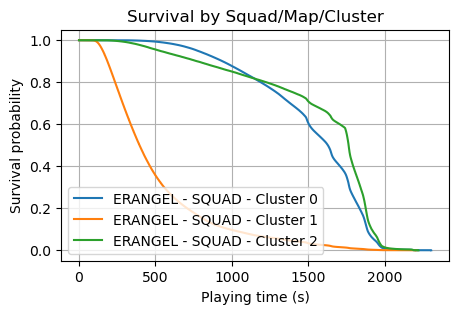

In [94]:
clustering_data = {}
for keys in map_squad_data.keys():
    sample_df = map_squad_data[keys]
    sdf = clustering(sample_df)
    clustering_data[keys] = sdf
    

Logistic Regression Accuracy: 0.7583
              precision    recall  f1-score   support

           0       0.80      0.77      0.78    296593
           1       0.71      0.75      0.73    222689

    accuracy                           0.76    519282
   macro avg       0.75      0.76      0.75    519282
weighted avg       0.76      0.76      0.76    519282



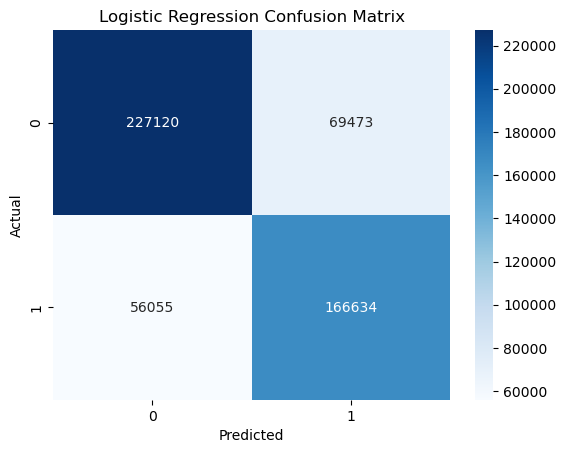

Decision Tree Accuracy: 0.9867
              precision    recall  f1-score   support

           0       0.99      0.99      0.99    296593
           1       0.98      0.99      0.98    222689

    accuracy                           0.99    519282
   macro avg       0.99      0.99      0.99    519282
weighted avg       0.99      0.99      0.99    519282



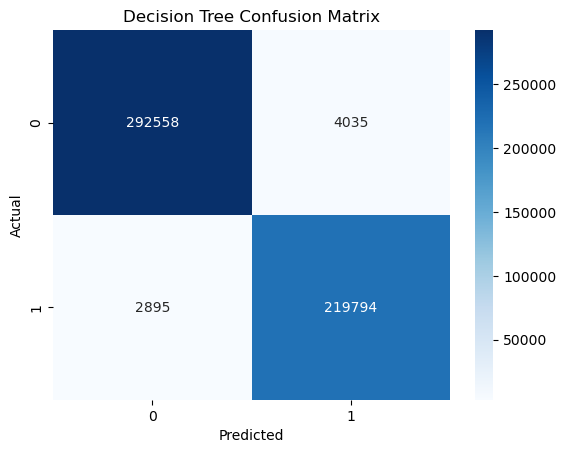

Random Forest Accuracy: 0.9878
              precision    recall  f1-score   support

           0       0.99      0.99      0.99    296593
           1       0.98      0.99      0.99    222689

    accuracy                           0.99    519282
   macro avg       0.99      0.99      0.99    519282
weighted avg       0.99      0.99      0.99    519282



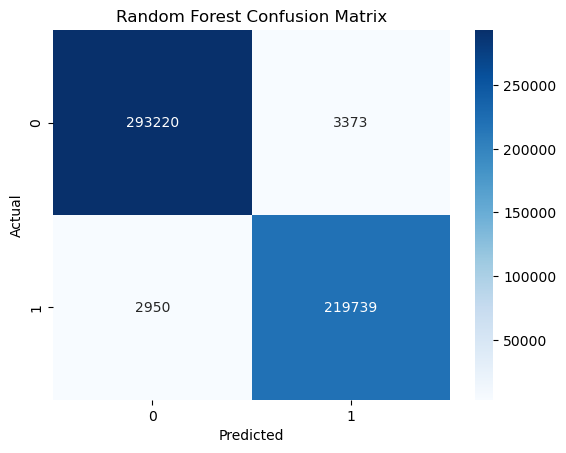

Gradient Boosting Accuracy: 0.7851
              precision    recall  f1-score   support

           0       0.81      0.82      0.81    296593
           1       0.75      0.74      0.75    222689

    accuracy                           0.79    519282
   macro avg       0.78      0.78      0.78    519282
weighted avg       0.78      0.79      0.78    519282



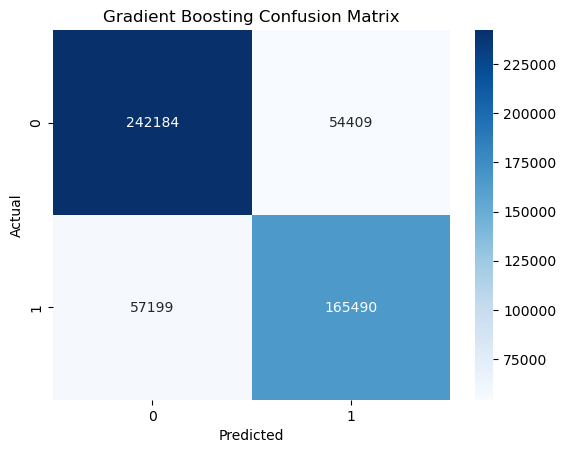

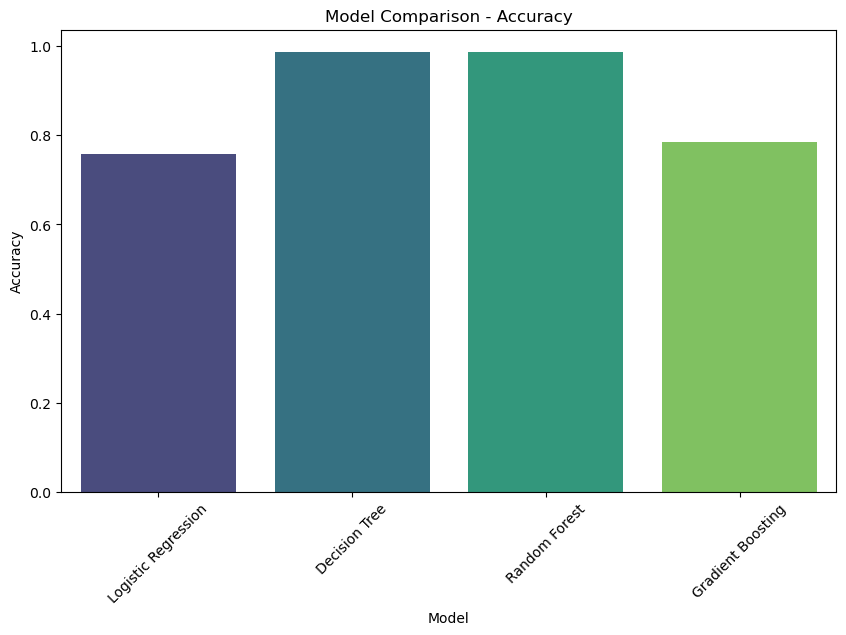

In [85]:
# 클러스터 결과를 원핫 인코딩
from sklearn.preprocessing import OneHotEncoder

# sample_df['cluster'] = sample_df['final_cluster']
encoder = OneHotEncoder()
cluster_encoded = encoder.fit_transform(sample_df[['cluster']]).toarray()
cluster_encoded_df = pd.DataFrame(cluster_encoded, columns=[f'cluster_{i}' for i in range(cluster_encoded.shape[1])])

# 원핫 인코딩 결과를 sample_df에 추가
sample_df = sample_df.reset_index(drop=True)
sample_df = pd.concat([sample_df, cluster_encoded_df], axis=1)

# 예측 모델을 위한 데이터 준비
X = sample_df[['player_dist_total', 'player_dmg', 'cluster_0', 'cluster_1', 'cluster_2']]
y = (sample_df['team_placement'] <= 5).astype(int)  # 상위 5위 이내인지 여부

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 다양한 모델 정의
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=100, random_state=42)
}

# 각 모델 학습 및 평가
results = {}
for model_name, model in models.items():
    # 모델 학습
    model.fit(X_train, y_train)
    # 예측
    y_pred = model.predict(X_test)
    # 정확도 계산
    accuracy = accuracy_score(y_test, y_pred)
    results[model_name] = accuracy
    # 평가 결과 출력
    print(f"{model_name} Accuracy: {accuracy:.4f}")
    print(classification_report(y_test, y_pred))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="Blues")
    plt.title(f"{model_name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

# 모델 비교 시각화
plt.figure(figsize=(10, 6))
model_names = list(results.keys())
accuracies = list(results.values())
sns.barplot(x=model_names, y=accuracies, palette='viridis')
plt.title('Model Comparison - Accuracy')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.xticks(rotation=45)
plt.show()
